In [ ]:
from pathlib import Path
import os

BASE_DIR = '/content/CV_lab6'
DIRS = [
    'datasets/rrs',
    'datasets/yolo_train/images',
    'datasets/yolo_train/labels',
    'datasets/yolo_val/images',
    'datasets/yolo_val/labels',
    'results',
    'my_photos',
    'report_images',
    'weights',
    'logs'
]

for dir_path in DIRS:
    Path(f"{BASE_DIR}/{dir_path}").mkdir(parents=True, exist_ok=True)
    print(f"Đã tạo: {dir_path}")

Đã tạo: datasets/rrs
Đã tạo: datasets/yolo_train/images
Đã tạo: datasets/yolo_train/labels
Đã tạo: datasets/yolo_val/images
Đã tạo: datasets/yolo_val/labels
Đã tạo: results
Đã tạo: my_photos
Đã tạo: report_images
Đã tạo: weights
Đã tạo: logs


In [ ]:
# CÀI ĐẶT PYTORCH VÀ YOLO
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121 -q
!pip install ultralytics -q
!pip install kaggle matplotlib opencv-python seaborn pandas tqdm -q

print("Đã cài đặt xong!")

import torch
from ultralytics import YOLO
import cv2

print(f"\n PyTorch version: {torch.__version__}")
print(f" CUDA available: {torch.cuda.is_available()}")
print(f" Device: {torch.device('cuda' if torch.cuda.is_available() else 'cpu')}")
print(f" YOLO version: {YOLO.__version__ if hasattr(YOLO, '__version__') else 'installed'}")

Đã cài đặt xong!

 PyTorch version: 2.5.1+cu121
 CUDA available: True
 Device: cuda
 YOLO version: installed


In [ ]:
#  TẢI DATASET
from getpass import getpass
import os

os.environ["KAGGLE_USERNAME"] = getpass("Kaggle username: ").strip()
os.environ["KAGGLE_KEY"] = getpass("Kaggle API key: ").strip()

!kaggle datasets download -d viacheslavshalamov/russian-road-signs-segmentation-dataset

!unzip -q russian-road-signs-segmentation-dataset.zip -d /content/CV_lab6/datasets/rrs

print("Dataset đã được tải và giải nén")
!ls /content/CV_lab6/datasets/rrs/sign_dataset/

Kaggle username: ··········
Kaggle API key: ··········
Dataset URL: https://www.kaggle.com/datasets/viacheslavshalamov/russian-road-signs-segmentation-dataset
License(s): unknown
100% 401M/401M [00:07<00:00, 58.4MB/s]

Dataset đã được tải và giải nén
train  val


In [ ]:
# TẠO YOLO DATASET

import json, cv2, shutil
from pathlib import Path

# 8 loại biển báo
CLASSES = ['StopSign', 'YieldSign', 'MainWay', 'CrossWalk',
           'Forbidden', 'SpeedZone', 'ParkArea', 'OtherSign']

base = '/content/CV_lab6/datasets'
sign_data = f"{base}/rrs/sign_dataset"

for split in ['train', 'val']:
    print(f"\n Đang xử lý {split}...")

    for sub in ['images', 'labels']:
        Path(f"{base}/yolo_{split}/{sub}").mkdir(parents=True, exist_ok=True)

    with open(f"{sign_data}/{split}/via_region_data.json") as f:
        data = json.load(f)

    metadata = data.get('_via_img_metadata', data)

    # Xử lý từng ảnh
    for img_id, info in metadata.items():

        src = f"{sign_data}/{split}/{info['filename']}"
        dst = f"{base}/yolo_{split}/images/{info['filename']}"
        shutil.copy(src, dst)

        label_path = f"{base}/yolo_{split}/labels/{Path(info['filename']).stem}.txt"
        with open(label_path, 'w') as out:
            regions = list(info.get('regions', {}).values()) if isinstance(info.get('regions'), dict) else info.get('regions', [])

            for reg in regions:
                shape = reg.get('shape_attributes', {})
                if shape.get('name') != 'polygon':
                    continue

                # Lấy class ID
                attrs = reg.get('region_attributes', {})
                class_id = 0
                for v in attrs.values():
                    try:
                        class_id = int(v) - 1
                        break
                    except:
                        pass

                # Lấy polygon và normalize
                xs, ys = shape.get('all_points_x', []), shape.get('all_points_y', [])
                if len(xs) < 3:
                    continue

                img = cv2.imread(src)
                h, w = img.shape[:2]
                poly = [coord for x, y in zip(xs, ys) for coord in [x/w, y/h]]

                out.write(f"{class_id} " + " ".join(map(str, poly)) + "\n")

    print(f" Xong {split}")

# Tạo file config
yaml = f"""
path: {base}
train: yolo_train/images
val: yolo_val/images
nc: {len(CLASSES)}
names: {CLASSES}
"""

with open(f"{base}/dataset.yaml", 'w') as f:
    f.write(yaml)

print(f"\nDataset tại: {base}")
print(f" Train: {len(list(Path(f'{base}/yolo_train/images').glob('*')))} ảnh")
print(f" Val: {len(list(Path(f'{base}/yolo_val/images').glob('*')))} ảnh")


 Đang xử lý train...
 Xong train

 Đang xử lý val...
 Xong val

Dataset tại: /content/CV_lab6/datasets
 Train: 2054 ảnh
 Val: 127 ảnh


In [ ]:
# Train Model
from ultralytics import YOLO
# Load model
model = YOLO('yolov8m-seg.pt')

# Train
results = model.train(
    data='/content/CV_lab6/datasets/dataset.yaml',
    epochs=30,
    imgsz=640,
    batch=16,
    device='cuda',
    workers=8,
    patience=15,
    save=True,
    project='/content/CV_lab6',
    name='yolo_segmentation',
    exist_ok=True,
    # Augmentations
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    degrees=10.0,
    translate=0.1,
    scale=0.5,
    fliplr=0.5,
    mosaic=1.0
)

print("\n TRAINING COMPLETED")

# Save model
model.export(format='onnx')
print("Model exported to ONNX")

Ultralytics 8.4.53 🚀 Python-3.12.13 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/CV_lab6/datasets/dataset.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo_segmentation, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mas

Upload 10 ảnh tự chụp biển báo:


Saving photo_5224381722345018994_y.jpg to photo_5224381722345018994_y.jpg
Saving photo_5224381722345018995_y.jpg to photo_5224381722345018995_y.jpg
Saving photo_5224381722345018996_y.jpg to photo_5224381722345018996_y.jpg
Saving photo_5224381722345018997_y.jpg to photo_5224381722345018997_y.jpg
Saving photo_5224381722345018998_y.jpg to photo_5224381722345018998_y.jpg
Saving photo_5224381722345018999_y.jpg to photo_5224381722345018999_y.jpg
Saving photo_5224381722345019000_y.jpg to photo_5224381722345019000_y.jpg
Saving photo_5224381722345019001_y.jpg to photo_5224381722345019001_y.jpg
Saving photo_5224381722345019002_y.jpg to photo_5224381722345019002_y.jpg
Saving photo_5224381722345019003_y.jpg to photo_5224381722345019003_y.jpg
Saving photo_5224381722345019004_y.jpg to photo_5224381722345019004_y.jpg
Saving photo_5224381722345019005_y.jpg to photo_5224381722345019005_y.jpg
Saving photo_5224381722345019006_y.jpg to photo_5224381722345019006_y.jpg
Saving photo_5224381722345019007_y.jpg

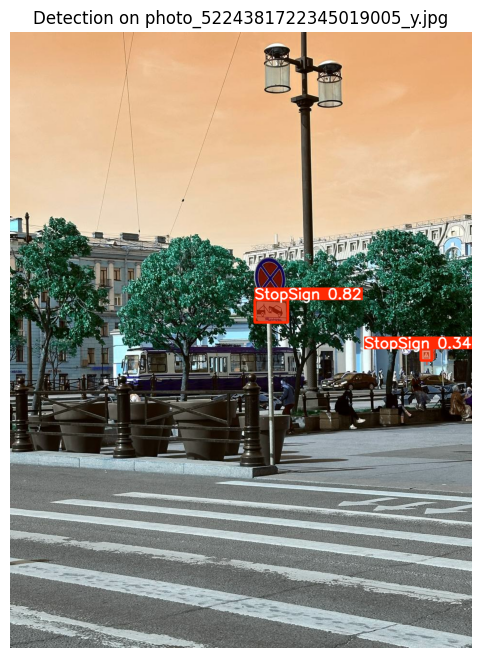

 Processed: photo_5224381722345019005_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019009_y.jpg: 640x480 2 StopSigns, 34.8ms
Speed: 4.0ms preprocess, 34.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


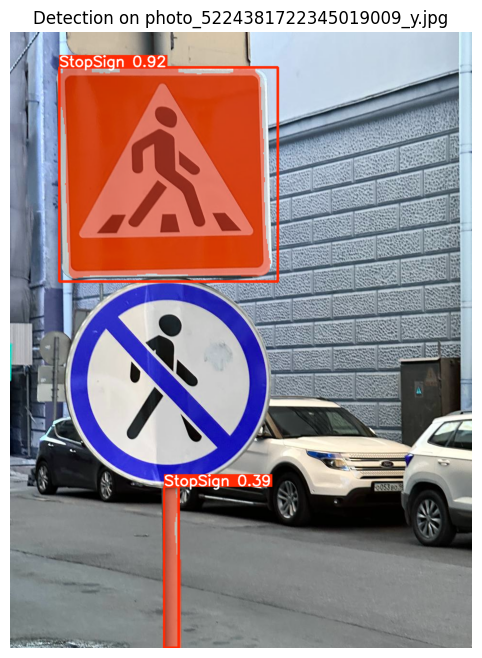

 Processed: photo_5224381722345019009_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345018999_y.jpg: 640x480 1 StopSign, 34.7ms
Speed: 3.2ms preprocess, 34.7ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 480)


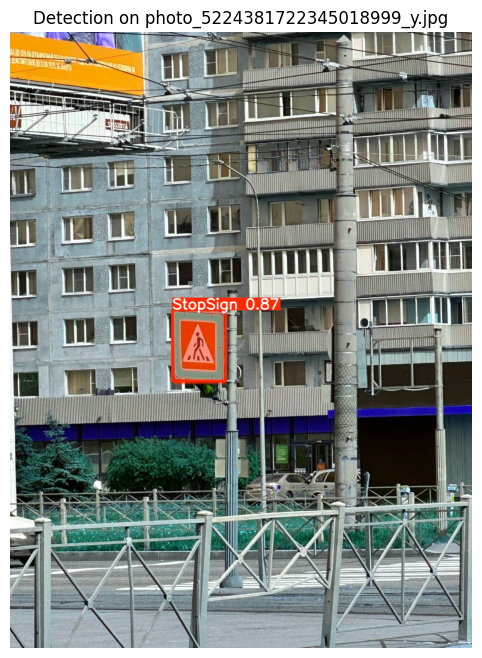

 Processed: photo_5224381722345018999_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019014_y.jpg: 640x480 2 StopSigns, 34.7ms
Speed: 3.3ms preprocess, 34.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


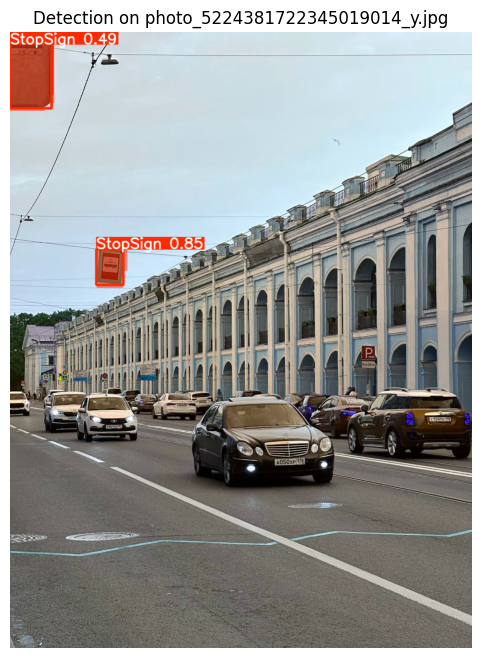

 Processed: photo_5224381722345019014_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019010_y.jpg: 640x480 2 StopSigns, 34.8ms
Speed: 3.4ms preprocess, 34.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


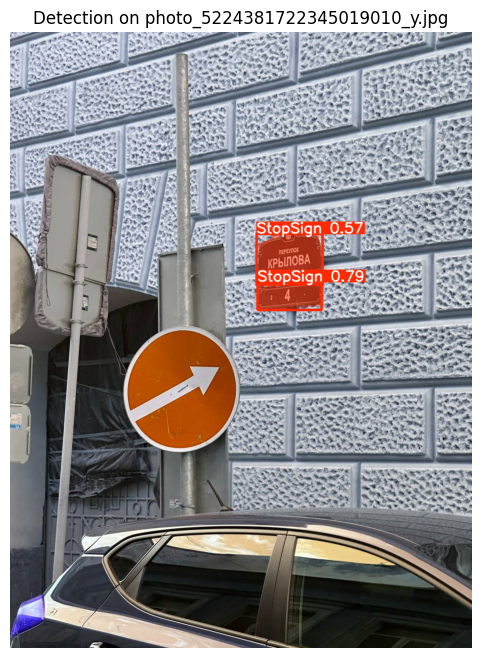

 Processed: photo_5224381722345019010_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019004_y.jpg: 640x480 1 StopSign, 34.7ms
Speed: 3.7ms preprocess, 34.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 480)


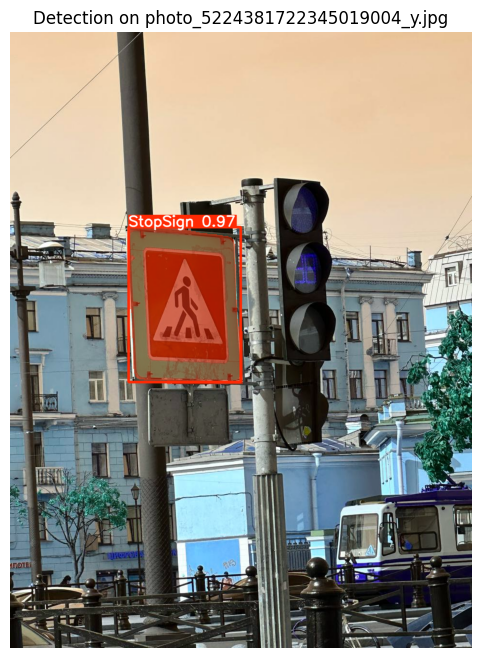

 Processed: photo_5224381722345019004_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019017_y.jpg: 640x480 7 StopSigns, 34.8ms
Speed: 3.2ms preprocess, 34.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


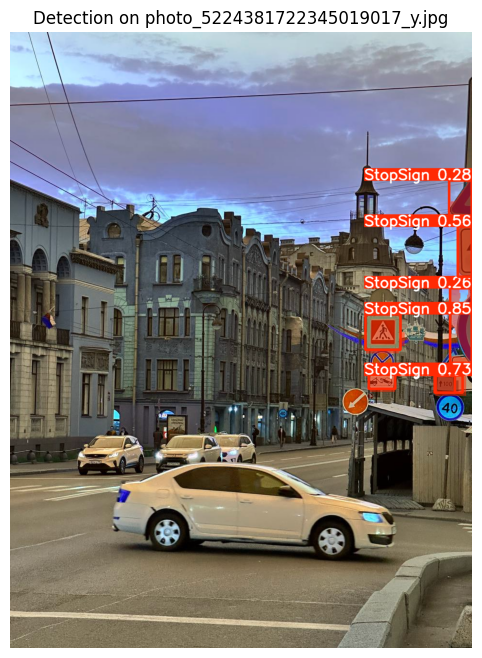

 Processed: photo_5224381722345019017_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019018_y.jpg: 640x480 3 StopSigns, 34.7ms
Speed: 3.3ms preprocess, 34.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


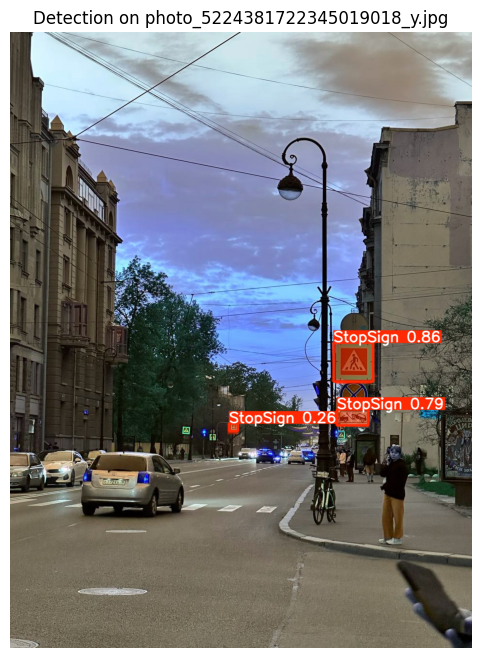

 Processed: photo_5224381722345019018_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345018996_y.jpg: 640x480 2 StopSigns, 34.7ms
Speed: 3.4ms preprocess, 34.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


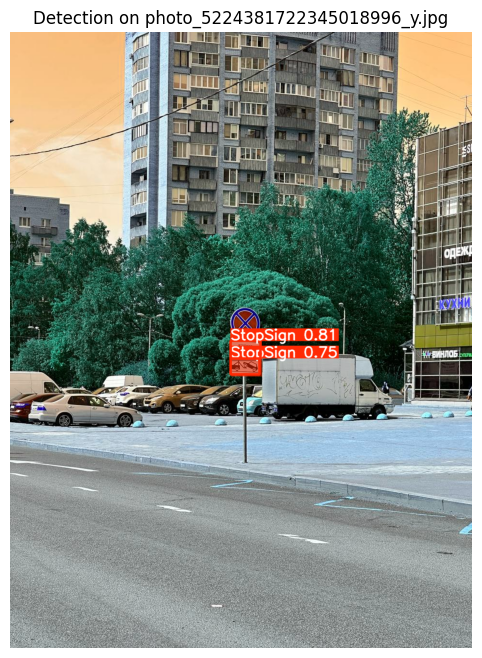

 Processed: photo_5224381722345018996_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019001_y.jpg: 640x480 2 StopSigns, 34.7ms
Speed: 3.6ms preprocess, 34.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 480)


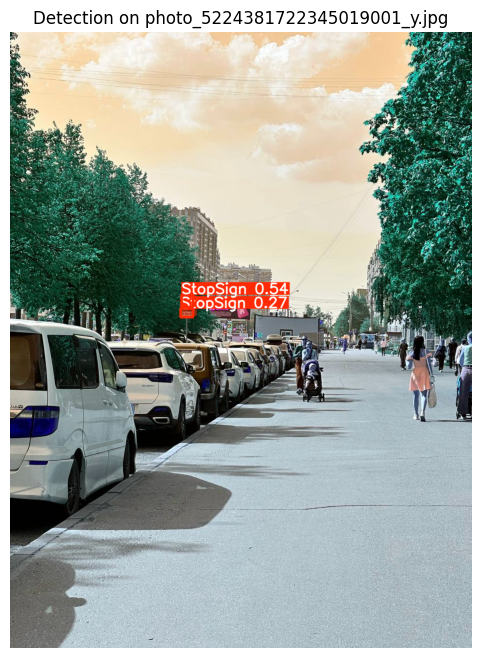

 Processed: photo_5224381722345019001_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019003_y.jpg: 640x480 (no detections), 34.7ms
Speed: 3.2ms preprocess, 34.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


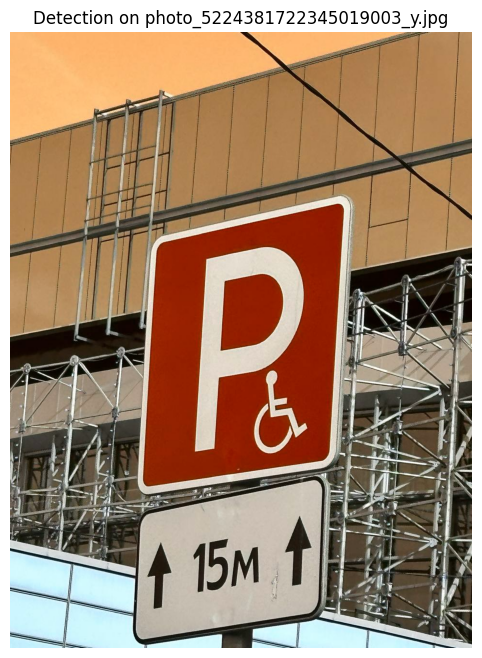

 Processed: photo_5224381722345019003_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019012_y.jpg: 640x480 3 StopSigns, 34.8ms
Speed: 3.4ms preprocess, 34.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 480)


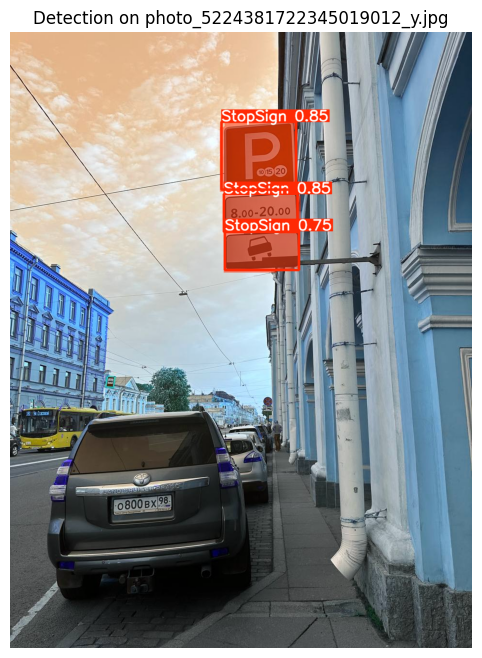

 Processed: photo_5224381722345019012_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019002_y.jpg: 640x480 2 StopSigns, 34.7ms
Speed: 3.4ms preprocess, 34.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


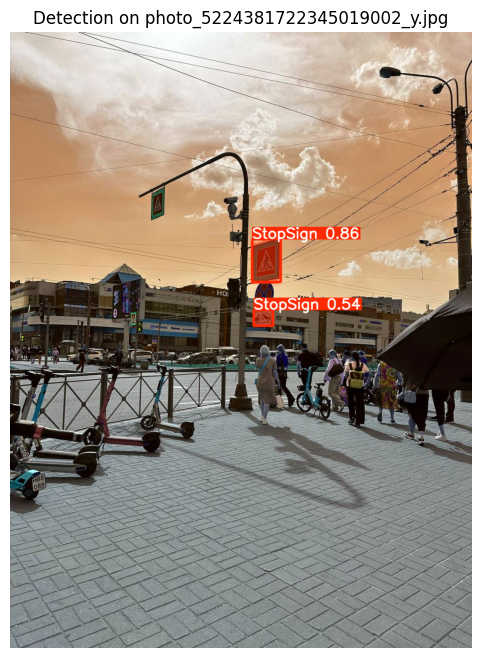

 Processed: photo_5224381722345019002_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019000_y.jpg: 640x480 (no detections), 34.8ms
Speed: 3.4ms preprocess, 34.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


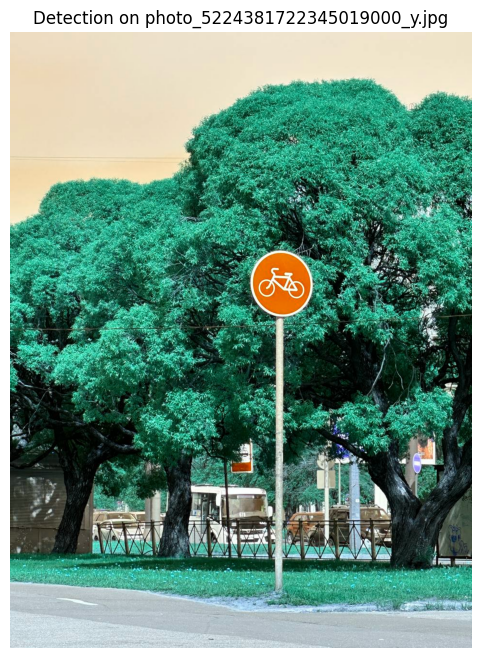

 Processed: photo_5224381722345019000_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019008_y.jpg: 640x480 1 StopSign, 34.7ms
Speed: 3.4ms preprocess, 34.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 480)


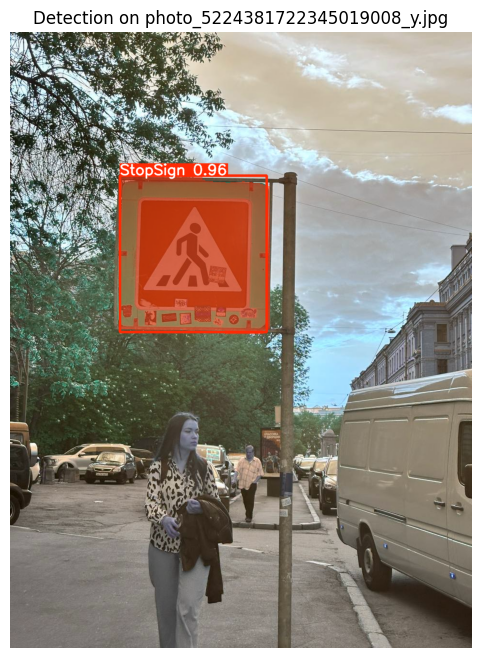

 Processed: photo_5224381722345019008_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019019_y.jpg: 640x480 2 StopSigns, 34.9ms
Speed: 4.3ms preprocess, 34.9ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 480)


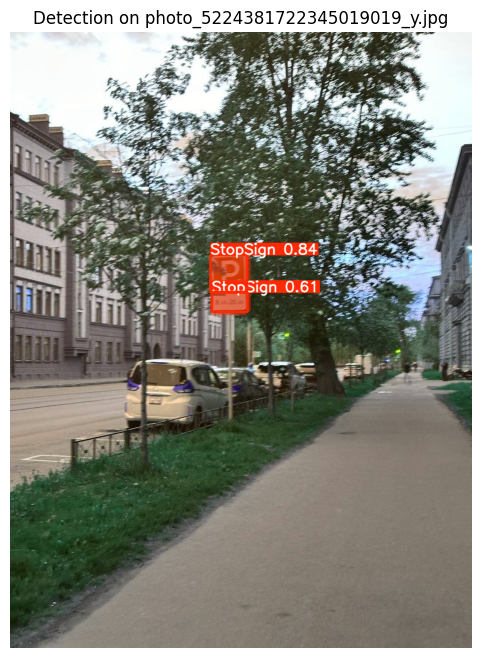

 Processed: photo_5224381722345019019_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345018994_y.jpg: 640x640 6 StopSigns, 47.5ms
Speed: 4.2ms preprocess, 47.5ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)


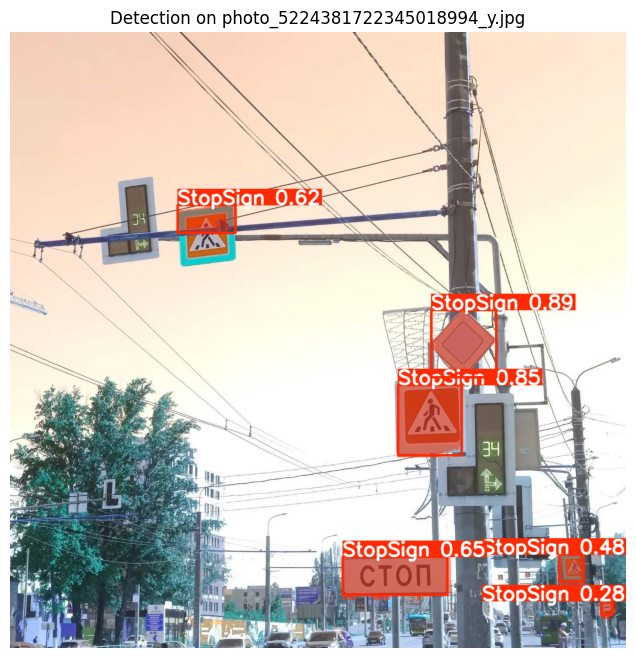

 Processed: photo_5224381722345018994_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345018997_y.jpg: 640x480 1 StopSign, 36.3ms
Speed: 3.1ms preprocess, 36.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 480)


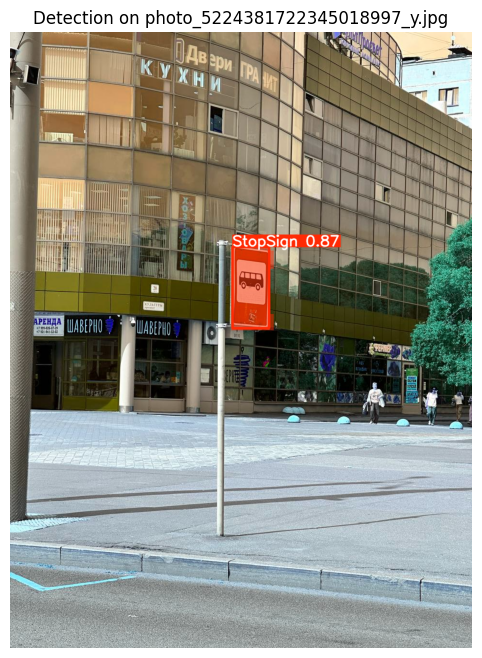

 Processed: photo_5224381722345018997_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019011_y.jpg: 640x480 2 StopSigns, 34.7ms
Speed: 3.4ms preprocess, 34.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 480)


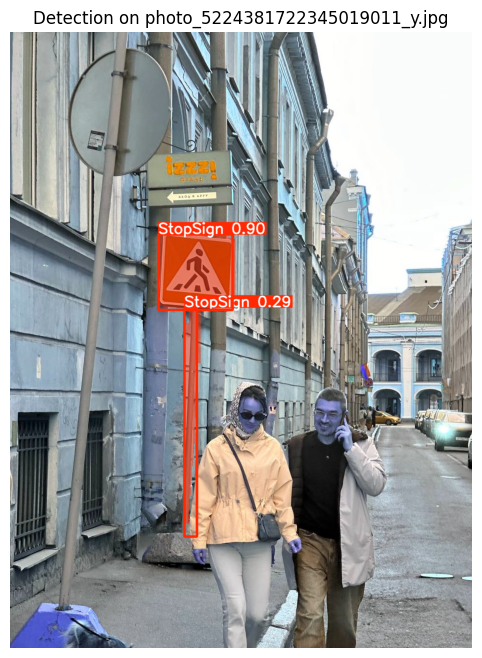

 Processed: photo_5224381722345019011_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019015_y.jpg: 640x480 3 StopSigns, 34.7ms
Speed: 3.2ms preprocess, 34.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


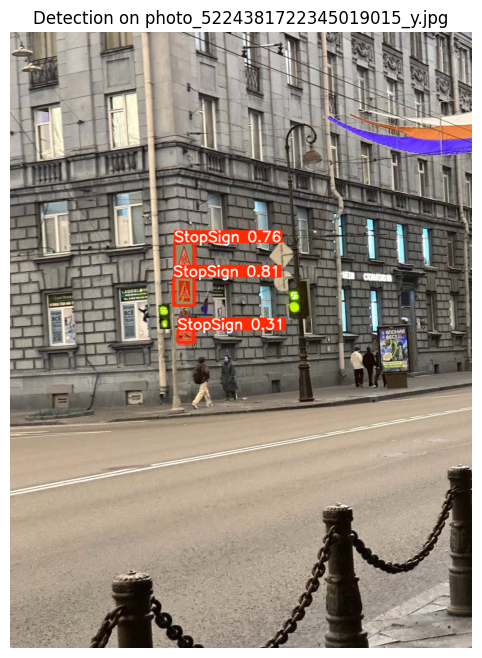

 Processed: photo_5224381722345019015_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019016_y.jpg: 640x480 6 StopSigns, 34.7ms
Speed: 3.3ms preprocess, 34.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 480)


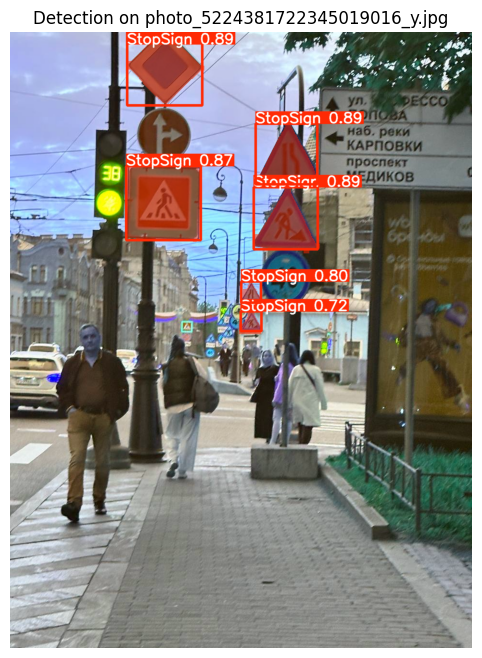

 Processed: photo_5224381722345019016_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019013_y.jpg: 640x480 1 StopSign, 34.9ms
Speed: 3.7ms preprocess, 34.9ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 480)


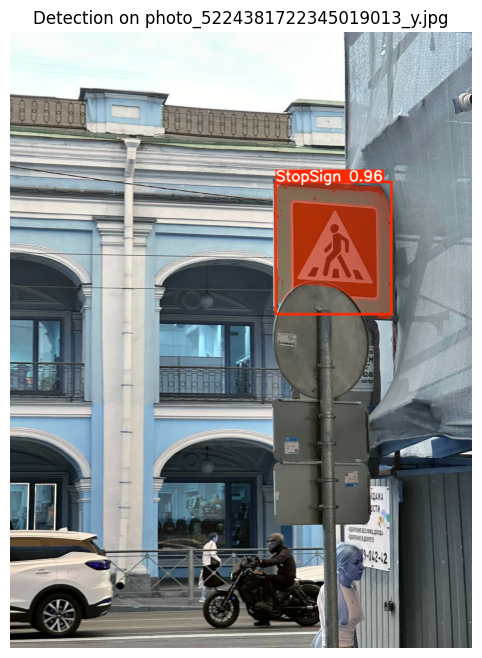

 Processed: photo_5224381722345019013_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345018998_y.jpg: 640x480 1 StopSign, 34.8ms
Speed: 3.2ms preprocess, 34.8ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 480)


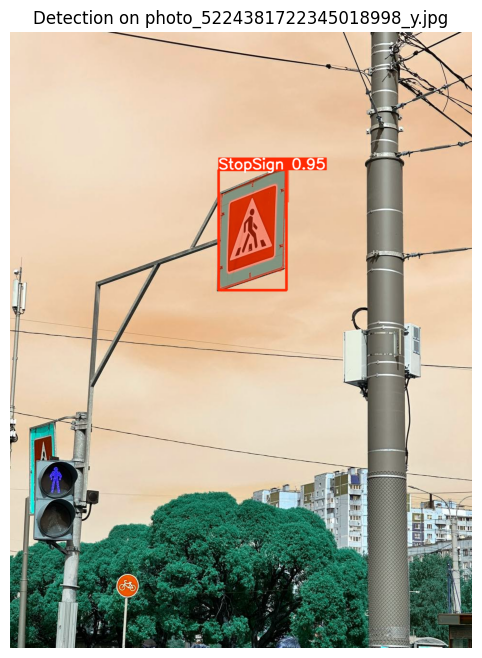

 Processed: photo_5224381722345018998_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019006_y.jpg: 640x480 2 StopSigns, 34.7ms
Speed: 5.3ms preprocess, 34.7ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 480)


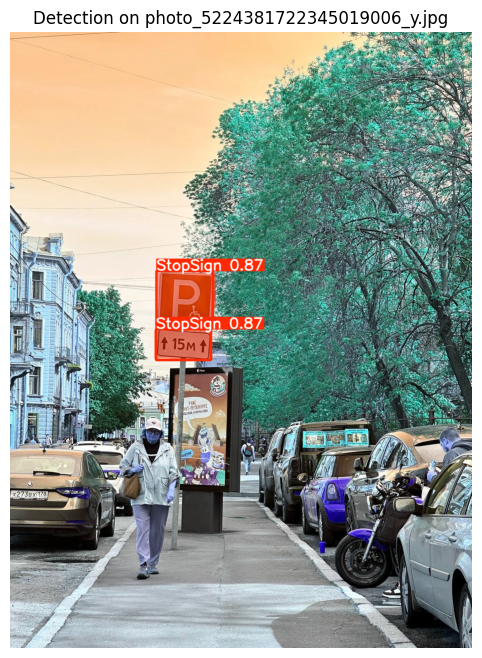

 Processed: photo_5224381722345019006_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019020_y.jpg: 640x480 1 StopSign, 34.8ms
Speed: 3.4ms preprocess, 34.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 480)


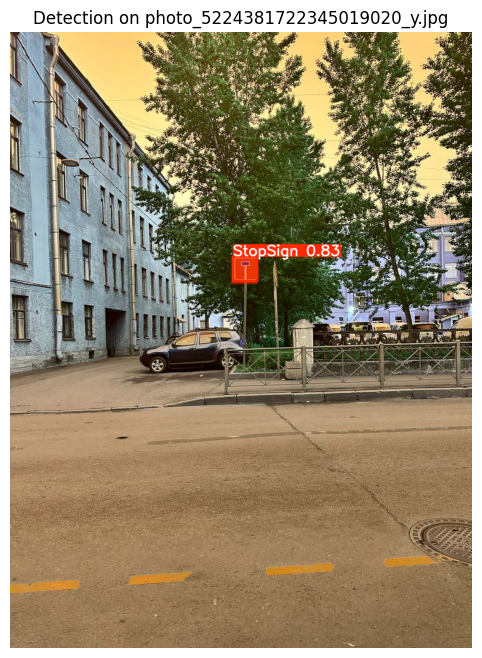

 Processed: photo_5224381722345019020_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345019007_y.jpg: 640x480 3 StopSigns, 34.7ms
Speed: 3.3ms preprocess, 34.7ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 480)


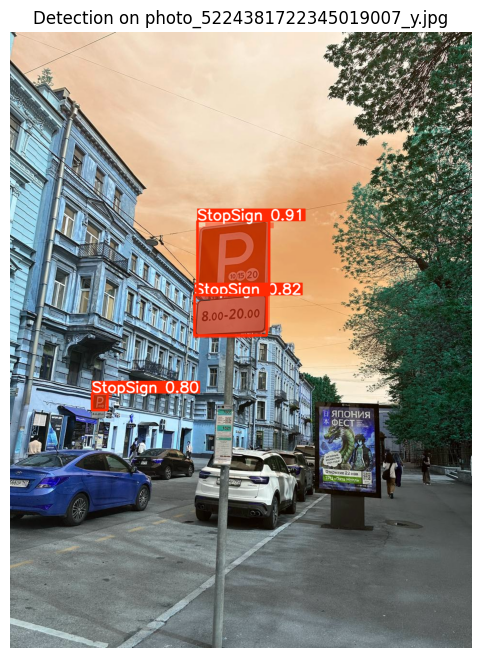

 Processed: photo_5224381722345019007_y.jpg

image 1/1 /content/CV_lab6/my_photos/photo_5224381722345018995_y.jpg: 640x480 1 StopSign, 34.7ms
Speed: 3.1ms preprocess, 34.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 480)


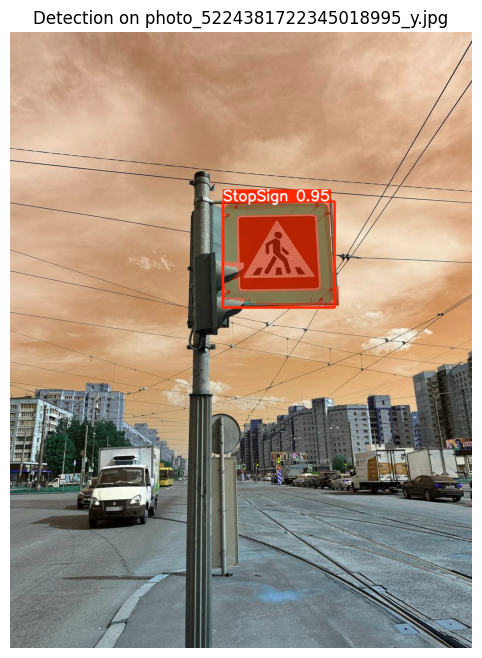

 Processed: photo_5224381722345018995_y.jpg

Xong


In [ ]:
# UPLOAD VÀ TEST ẢNH TỰ CHỤP
from google.colab import files
import matplotlib.pyplot as plt

print("Upload 10 ảnh tự chụp biển báo:")

uploaded = files.upload()

for filename in uploaded.keys():
    shutil.move(filename, f'/content/CV_lab6/my_photos/{filename}')

print("\nĐang test trên ảnh tự chụp...")

for img_path in Path('/content/CV_lab6/my_photos').glob('*.*'):
    if img_path.suffix.lower() in ['.jpg', '.jpeg', '.png']:
        results = model(str(img_path))

        results[0].save(f'/content/CV_lab6/results/result_{img_path.name}')

        # Display
        plt.figure(figsize=(10, 8))
        plt.imshow(results[0].plot())
        plt.axis('off')
        plt.title(f'Detection on {img_path.name}')
        plt.show()

        print(f" Processed: {img_path.name}")

print("\nXong")